**Если времени мало, то переходите на часть с image_size = 128**

In [1]:
!pip install torchinfo
from torchinfo import summary
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import models
import torchvision.transforms as tt
import torch
import torch.nn as nn
import gc
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
from sklearn.model_selection import LeaveOneOut
from sklearn.neighbors import KNeighborsClassifier
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import clear_output
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Подготовка датасета

In [3]:
#for colab
DATA_DIR = '/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/images'

#for kaggle
#DATA_DIR = '../input/pokemons/images'

In [4]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [5]:
 # будем использовать единственную аугментацию данных: горизонтально отражение, 
 # так как все другие аугментацию извратят желаемые картинки

def get_dataloader(image_size, batch_size, DATA_DIR):
  data_ds = ImageFolder(DATA_DIR, transform = tt.Compose([
      tt.Resize((image_size, image_size)),
      tt.ToTensor(),
      tt.RandomHorizontalFlip(),
      tt.Normalize(*stats)
  ]))

  loader = DataLoader(data_ds, batch_size=batch_size, shuffle=True, num_workers=2)
  return loader

In [6]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [7]:
train_dl = get_dataloader(image_size, batch_size, DATA_DIR)

In [8]:
#посмотрим на картинки из датасета
batch = next(iter(train_dl))[0]
print(batch[0].size())

torch.Size([3, 64, 64])


In [9]:
# данных очень мало, а аугментаций почти нет
len(train_dl.dataset)

2503

In [10]:
def show_images(images, nmax=64, figsize=(18, 18)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach().cpu()[:nmax]), nrow=int(np.sqrt(nmax))).permute(1, 2, 0))

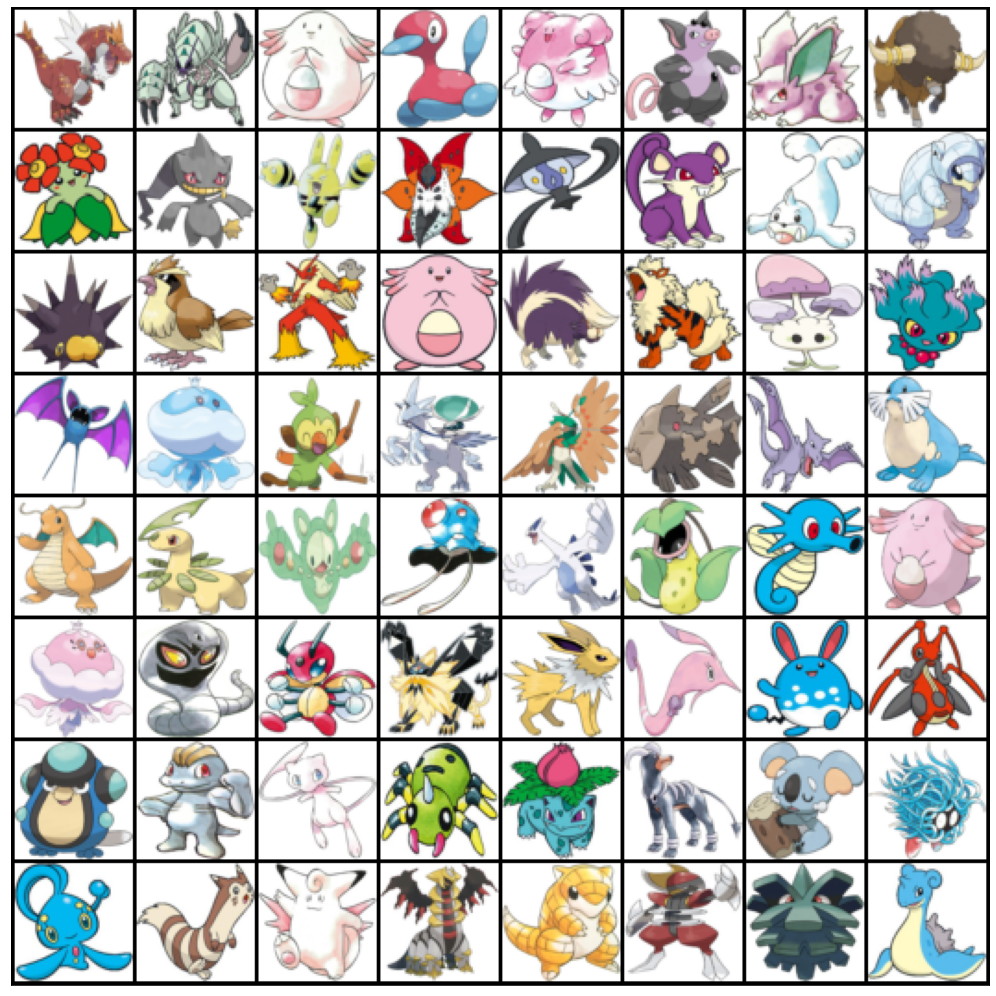

In [11]:
show_images(batch)

# 2. Архитектура модели и обучение

## image size = 64

In [16]:
gc.collect()
torch.cuda.empty_cache()

In [17]:
discriminator_64 = nn.Sequential(
    # in: 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    # out: 128 x 16 x 16
    
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2),
    # out: 256 x 8 x 8
    
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
    ) 

In [18]:
latent_size = 100

generator_64 = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

In [19]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [20]:
def fit(model, criterion, n_epochs, lr_disc, lr_gen, dataloader, label_noise, loss_name, stage):
    gen_losses = []
    disc_losses = []
    real_scores = []
    fake_scores = []

    model["discriminator"].train()
    model["generator"].train()
    gc.collect()
    torch.cuda.empty_cache()

    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), lr=lr_disc, 
                                          betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(), lr=lr_gen,
                                      betas=(0.5, 0.999))
    }

    for epoch in tqdm(range(n_epochs)):
        gen_losses_per_epoch = []
        disc_losses_per_epoch = []
        real_scores_per_epoch = []
        fake_scores_per_epoch = []
        
        for ind, real_images in enumerate(tqdm(dataloader)):
            
            real_images = real_images[0].to(device)
            shape = real_images.size()
            
            # Train discriminator
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            if label_noise == True:
                noise = torch.FloatTensor(shape[0], 1).uniform_(0, 0.1).to(device)
            else:
                noise = torch.zeros(shape[0], 1).to(device)
            real_labels = torch.ones(shape[0], 1, device=device) - noise
            fake_labels = torch.zeros(shape[0], 1, device=device) + noise
            
            # Flipping labels with probability 0.1
            if (torch.bernoulli(torch.FloatTensor([0.1]))):
                real_labels, fake_labels = fake_labels, real_labels
            
            real_loss = criterion["discriminator"](real_preds, real_labels)
            cur_real_score = torch.mean(real_preds).item()
                
            # Generate images
            latent = torch.randn(shape[0], latent_size, 1, 1, device=device)
            fake_images1 = model["generator"](latent)
            
            # Pass fake images through discriminator
            
            fake_preds = model["discriminator"](fake_images1.to(device))
            fake_loss = criterion["discriminator"](fake_preds, fake_labels)
            cur_fake_score = torch.mean(fake_preds).item()
            
            real_scores_per_epoch.append(cur_real_score)
            fake_scores_per_epoch.append(cur_fake_score)
            
            # Update discriminator loss
            disc_loss = real_loss + fake_loss
            disc_loss.backward(retain_graph=True)
            optimizer["discriminator"].step()
            disc_losses_per_epoch.append(disc_loss.item())
        
            # Train generator
            optimizer["generator"].zero_grad()

            # Generate fake images
            latent = torch.randn(shape[0], latent_size, 1, 1, device=device)
            fake_images2 = model["generator"](latent)

            # Try to fool discriminator
            preds = model["discriminator"](fake_images2.to(device))
            labels = torch.ones(shape[0], 1, device=device)
            gen_loss = criterion["generator"](preds, labels)

            # Update generators weights
            gen_loss.backward()
            optimizer["generator"].step()
            gen_losses_per_epoch.append(gen_loss.item())
            
            # Clear memory
            del fake_images1
            del real_images
            torch.cuda.empty_cache
        
        #Save model every 100 epochs
        if (epoch + 1) % 100 == 0:
            torch.save(model['discriminator'].state_dict(), 'disc_' + str(image_size) + '_' + str((stage - 1) * 300 + (epoch + 1)) + '_epochs.pth')
            torch.save(model['generator'].state_dict(), 'gen_' + str(image_size) + '_' + str((stage - 1) * 300 +  (epoch + 1)) + '_epochs.pth')
        
        #Record losses and scores
        gen_losses.append(np.mean(gen_losses_per_epoch))
        disc_losses.append(np.mean(disc_losses_per_epoch))
        real_scores.append(np.mean(real_scores_per_epoch))
        fake_scores.append(np.mean(fake_scores_per_epoch))

        # show intermediate results
        clear_output(wait=True)
        fig = plt.figure(figsize=(24, 8))
        for i in range(6):
            ax = fig.add_subplot(2, 6, i + 1)
            ax.imshow(denorm(fake_images2[i]).permute(1, 2, 0).detach().cpu().numpy())
            ax.set_title("Fake image")
            ax.axis('off')
        del fake_images2
        torch.cuda.empty_cache()
        
        #draw losses and scores
        epochs = np.arange(1, epoch + 2)

        ax1 = fig.add_subplot(2, 2, 3)
        ax1.plot(epochs, gen_losses, label='generator')
        ax1.plot(epochs, disc_losses, label='discriminator')
        ax1.set_title(loss_name + "loss")
        ax1.set_xlabel('epochs')
        ax1.set_ylabel('loss')
        ax1.grid()
        ax1.legend(fontsize=14)

        ax2 = fig.add_subplot(2, 2, 4)
        ax2.plot(epochs, real_scores, label='real')
        ax2.plot(epochs, fake_scores, label='fake')
        ax2.set_title("Scores")
        ax2.set_xlabel('epochs')
        ax2.set_ylabel('score')
        ax2.grid()
        ax2.legend(fontsize=14)

        plt.suptitle(f"{epoch+1} / {n_epochs} - generator_loss: {gen_losses[-1]:0.4f}, discriminator:{disc_losses[-1]:0.4f}")
        plt.show()

    return gen_losses, disc_losses, real_scores, fake_scores

In [21]:
criterion_bce = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [22]:
model = {
    "discriminator": discriminator_64.to(device),
    "generator": generator_64.to(device)
}

In [23]:
summary(model['discriminator'], input_size=(batch_size, 3, image_size, image_size))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [128, 1]                  --
├─Conv2d: 1-1                            [128, 64, 32, 32]         3,072
├─BatchNorm2d: 1-2                       [128, 64, 32, 32]         128
├─LeakyReLU: 1-3                         [128, 64, 32, 32]         --
├─Conv2d: 1-4                            [128, 128, 16, 16]        131,072
├─BatchNorm2d: 1-5                       [128, 128, 16, 16]        256
├─LeakyReLU: 1-6                         [128, 128, 16, 16]        --
├─Conv2d: 1-7                            [128, 256, 8, 8]          524,288
├─BatchNorm2d: 1-8                       [128, 256, 8, 8]          512
├─LeakyReLU: 1-9                         [128, 256, 8, 8]          --
├─Conv2d: 1-10                           [128, 512, 4, 4]          2,097,152
├─BatchNorm2d: 1-11                      [128, 512, 4, 4]          1,024
├─LeakyReLU: 1-12                        [128, 512, 4, 4]  

In [24]:
summary(model['generator'], input_size=(batch_size, latent_size, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [128, 3, 64, 64]          --
├─ConvTranspose2d: 1-1                   [128, 512, 4, 4]          819,200
├─BatchNorm2d: 1-2                       [128, 512, 4, 4]          1,024
├─ReLU: 1-3                              [128, 512, 4, 4]          --
├─ConvTranspose2d: 1-4                   [128, 256, 8, 8]          2,097,152
├─BatchNorm2d: 1-5                       [128, 256, 8, 8]          512
├─ReLU: 1-6                              [128, 256, 8, 8]          --
├─ConvTranspose2d: 1-7                   [128, 128, 16, 16]        524,288
├─BatchNorm2d: 1-8                       [128, 128, 16, 16]        256
├─ReLU: 1-9                              [128, 128, 16, 16]        --
├─ConvTranspose2d: 1-10                  [128, 64, 32, 32]         131,072
├─BatchNorm2d: 1-11                      [128, 64, 32, 32]         128
├─ReLU: 1-12                             [128, 64, 32, 32

### Пример обучения (дальше будет опущено)

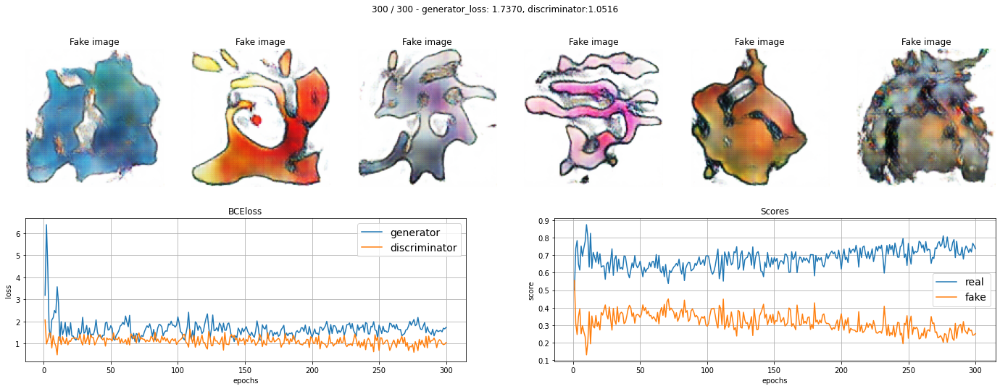

CPU times: user 24min 6s, sys: 1min 58s, total: 26min 5s
Wall time: 57min 17s


In [ ]:
%%time

epochs = 300
lr_disc = 0.0002
lr_gen = 0.0002

gen_losses_extended, disc_losses_extended, real_scores_extended, fake_scores_extended = fit(model, criterion_bce, epochs, 
                                                                                            lr_disc, lr_gen, train_dl, True, 'BCE')

### 900 epochs

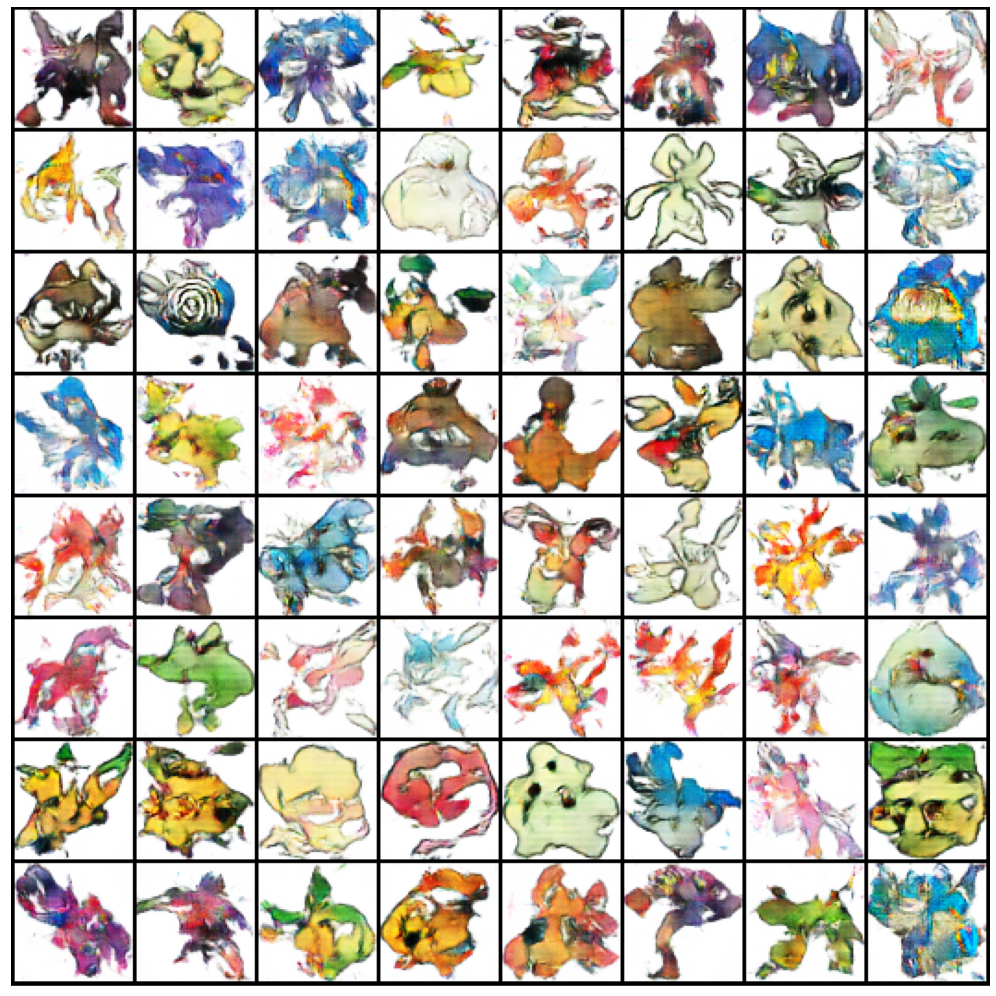

In [25]:
model64_900 = {
    "discriminator": discriminator_64.to(device),
    "generator": generator_64.to(device)
}
model64_900['discriminator'].load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc64_900_epochs.pth'))
model64_900['generator'].load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen64_900_epochs.pth'))

n_images = 64
fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model64_900["generator"](fixed_latent)

show_images(fake_images)

### 1000 epochs

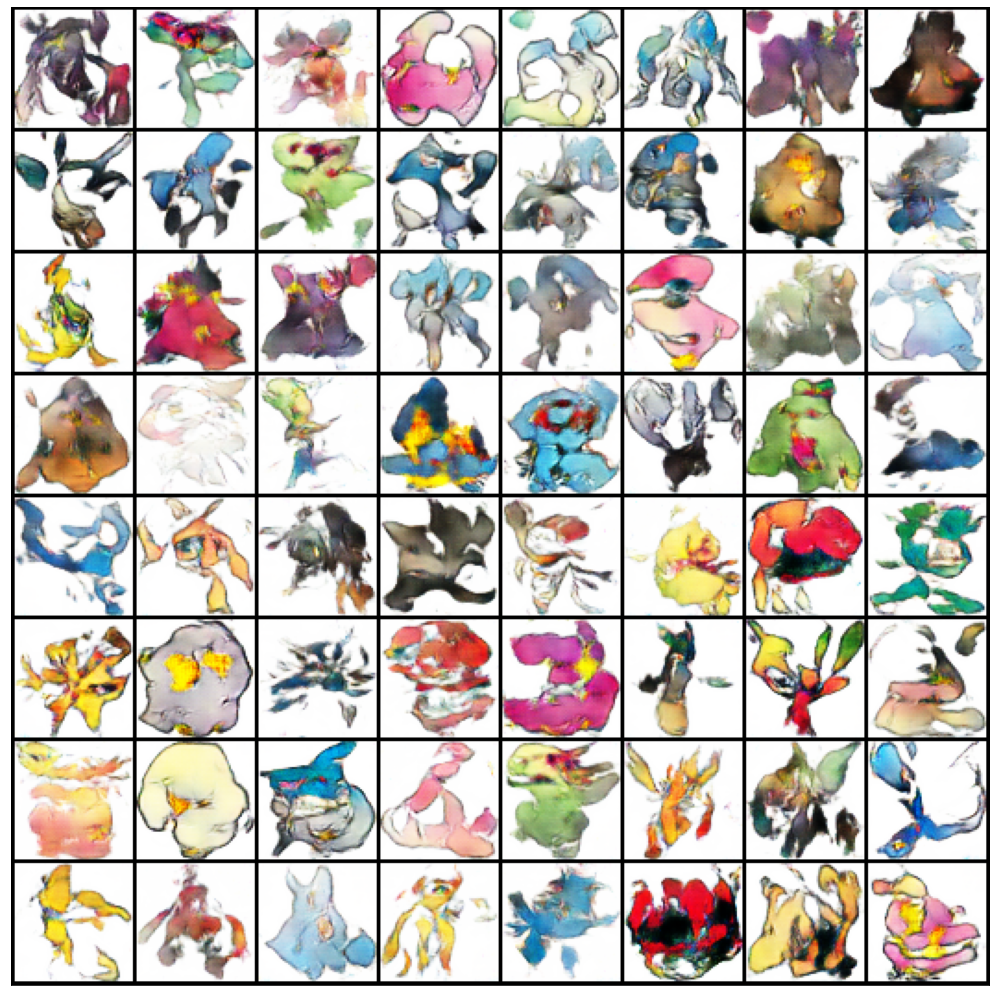

In [27]:
model64_1000 = {
    "discriminator": discriminator_64.to(device),
    "generator": generator_64.to(device)
}
model64_1000['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc64_1000_epochs.pth"))
model64_1000['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen64_1000_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model64_1000["generator"](fixed_latent)

show_images(fake_images)

### 1100 epochs

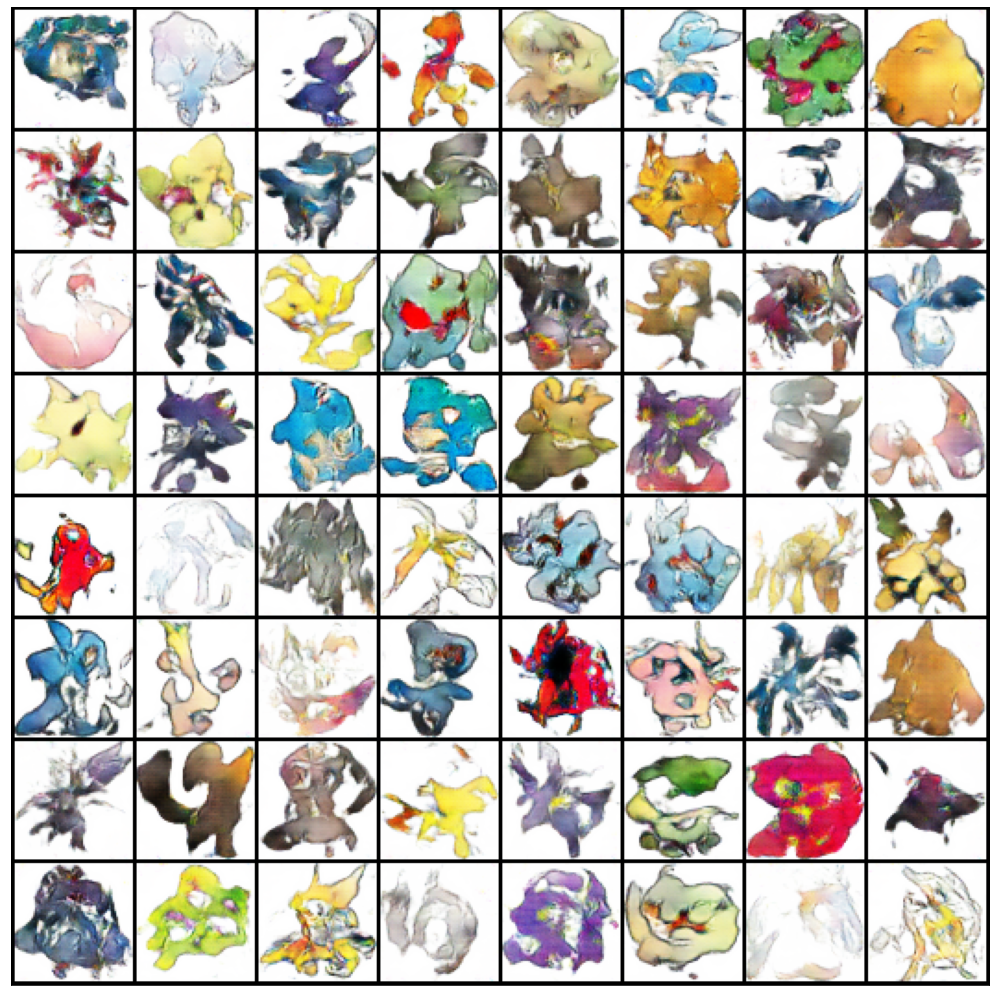

In [28]:
model64_1100 = {
    "discriminator": discriminator_64.to(device),
    "generator": generator_64.to(device)
}
model64_1100['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc64_1100_epochs.pth"))
model64_1100['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen64_1100_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model64_1100["generator"](fixed_latent)

show_images(fake_images)

### 1200 epochs

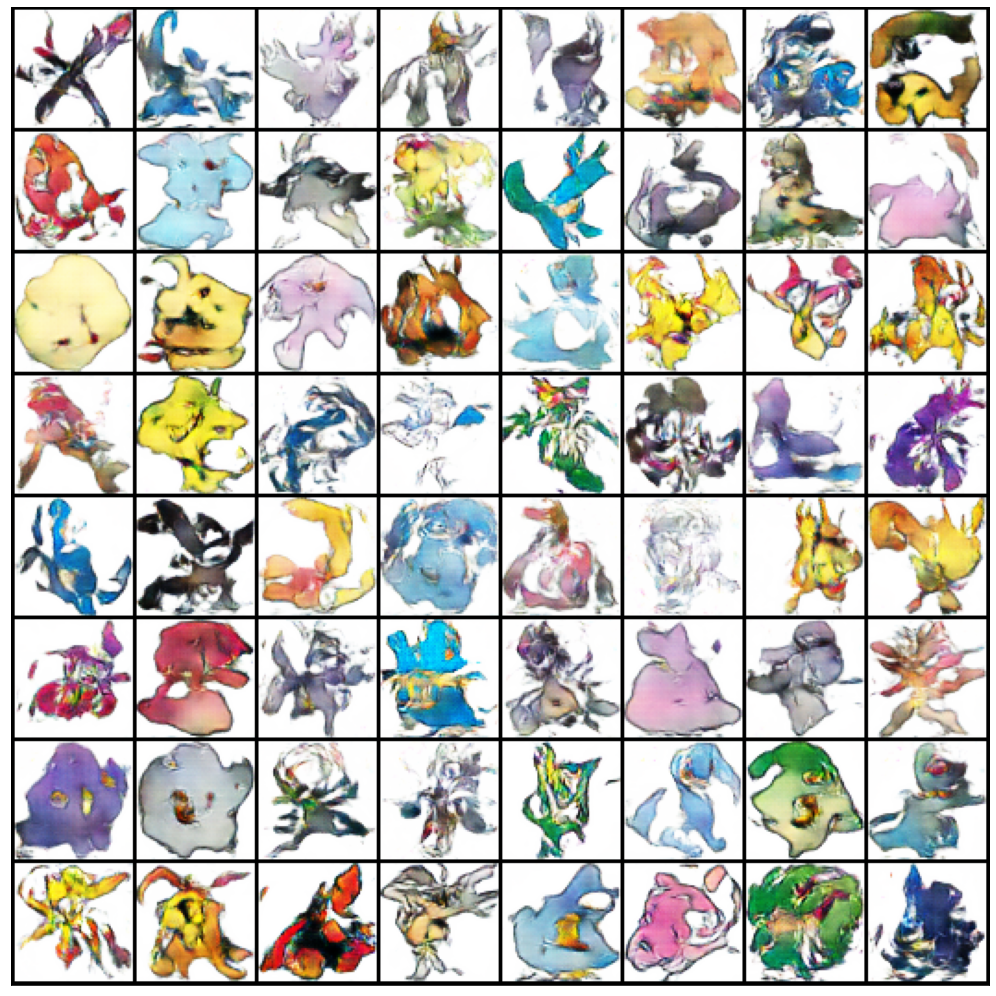

In [29]:
model64_1200 = {
    "discriminator": discriminator_64.to(device),
    "generator": generator_64.to(device)
}
model64_1200['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc64_1200_epochs.pth"))
model64_1200['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen64_1200_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model64_1200["generator"](fixed_latent)

show_images(fake_images)

## image size = 128

In [30]:
image_size = 128

Попробуем увеличить разрешение картинок. Также хочется получить текстуру внутри покемонов, поэтому попробуем добавить еще несколько фишек:


*   Возьмём MSE loss
*   Добавим Gauss noise в дискриминатор



In [31]:
class GaussianNoise(nn.Module):
    def __init__(self, gauss_std=0.2, std_decay_rate=0.1):
        super().__init__()
        self.std = gauss_std
        self.decay_rate = std_decay_rate

    def decay_step(self):
        self.std = max(self.std - self.decay_rate, 0)

    def forward(self, x):
        if self.training:
            return x + torch.empty_like(x).normal_(mean=0, std=self.std)
        else:
            return x

In [32]:
discriminator_128 = nn.Sequential(
    # in: 3 x 128 x 128
    GaussianNoise(),
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2),
    # out: 64 x 64 x 64

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2),
    # out: 128 x 32 x 32
    
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2),
    # out: 256 x 16 x 16
    
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2),
    # out: 512 x 8 x 8

    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2),
    # out: 1024 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
    ) 

In [33]:
latent_size = 100

generator_128 = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(),
    # out: 1024 x 4 x 4

    nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.Dropout(0.5),
    nn.ReLU(),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    # out: 128 x 32 x 32
    
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    # out: 64 x 64 x 64

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128
)

In [34]:
criterion_mse = {
    "discriminator": nn.MSELoss(),
    "generator": nn.MSELoss()
}
model_128 = {
    "discriminator": discriminator_128.to(device),
    "generator": generator_128.to(device)
}

In [35]:
summary(model_128['discriminator'], input_size=(batch_size, 3, image_size, image_size))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [128, 1]                  --
├─GaussianNoise: 1-1                     [128, 3, 128, 128]        --
├─Conv2d: 1-2                            [128, 64, 64, 64]         3,072
├─BatchNorm2d: 1-3                       [128, 64, 64, 64]         128
├─LeakyReLU: 1-4                         [128, 64, 64, 64]         --
├─Conv2d: 1-5                            [128, 128, 32, 32]        131,072
├─BatchNorm2d: 1-6                       [128, 128, 32, 32]        256
├─LeakyReLU: 1-7                         [128, 128, 32, 32]        --
├─Conv2d: 1-8                            [128, 256, 16, 16]        524,288
├─BatchNorm2d: 1-9                       [128, 256, 16, 16]        512
├─LeakyReLU: 1-10                        [128, 256, 16, 16]        --
├─Conv2d: 1-11                           [128, 512, 8, 8]          2,097,152
├─BatchNorm2d: 1-12                      [128, 512, 8, 8]     

In [36]:
summary(model_128['generator'], input_size=(batch_size, latent_size, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [128, 3, 128, 128]        --
├─ConvTranspose2d: 1-1                   [128, 1024, 4, 4]         1,638,400
├─BatchNorm2d: 1-2                       [128, 1024, 4, 4]         2,048
├─ReLU: 1-3                              [128, 1024, 4, 4]         --
├─ConvTranspose2d: 1-4                   [128, 512, 8, 8]          8,388,608
├─BatchNorm2d: 1-5                       [128, 512, 8, 8]          1,024
├─ReLU: 1-6                              [128, 512, 8, 8]          --
├─ConvTranspose2d: 1-7                   [128, 256, 16, 16]        2,097,152
├─BatchNorm2d: 1-8                       [128, 256, 16, 16]        512
├─Dropout: 1-9                           [128, 256, 16, 16]        --
├─ReLU: 1-10                             [128, 256, 16, 16]        --
├─ConvTranspose2d: 1-11                  [128, 128, 32, 32]        524,288
├─BatchNorm2d: 1-12                      [128, 128, 

### 900 epochs

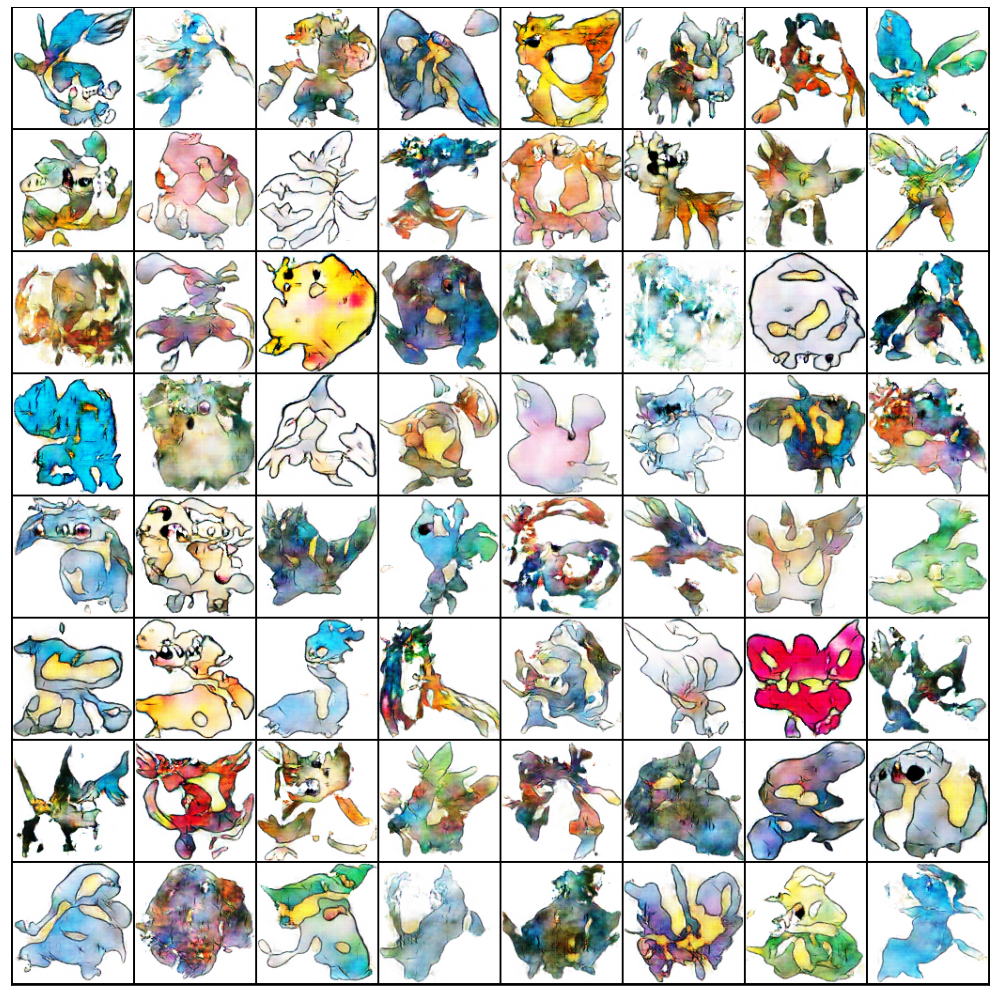

In [40]:
model128_900 = {
    "discriminator": discriminator_128.to(device),
    "generator": generator_128.to(device)
}
model128_900['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc_128_900_epochs.pth"))
model128_900['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen_128_900_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model128_900["generator"](fixed_latent)

show_images(fake_images)

### 1000 epochs

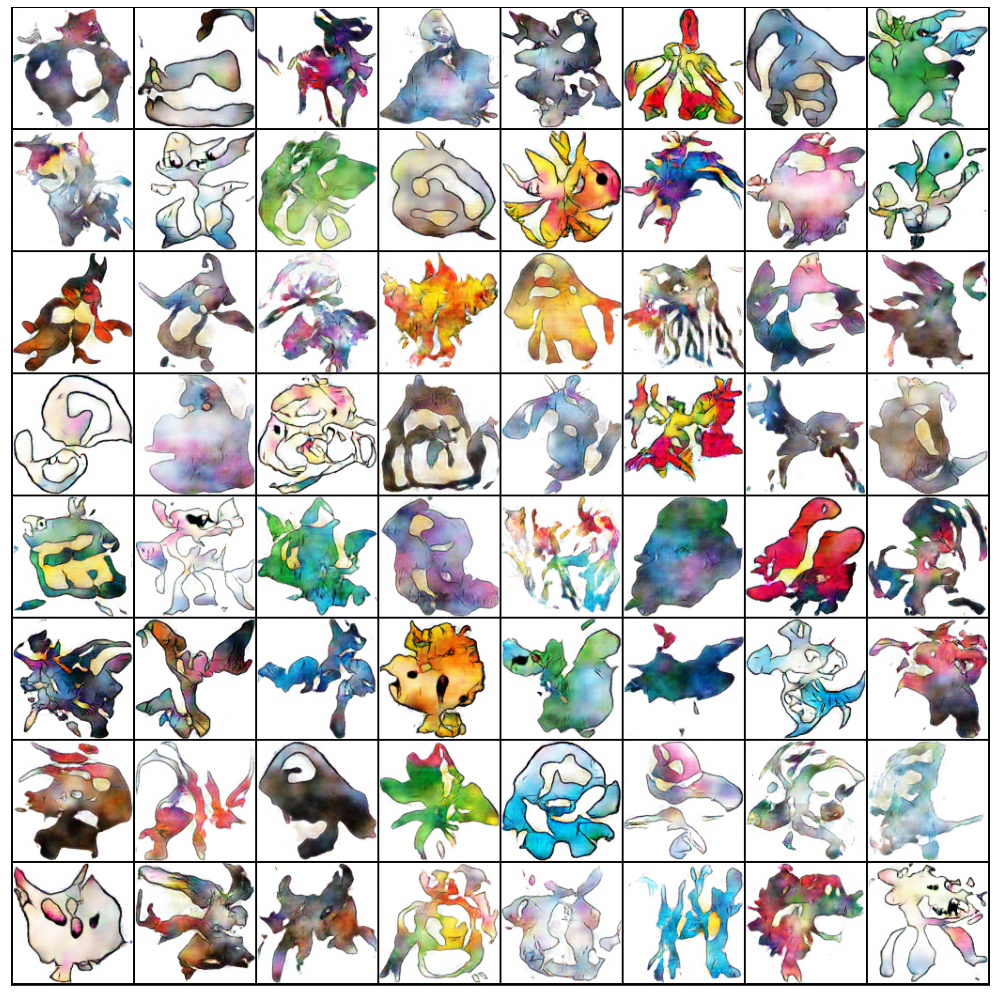

In [41]:
model128_1000 = {
    "discriminator": discriminator_128.to(device),
    "generator": generator_128.to(device)
}
model128_1000['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc_128_1000_epochs.pth"))
model128_1000['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen_128_1000_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model128_1000["generator"](fixed_latent)

show_images(fake_images)

### 1100 epochs

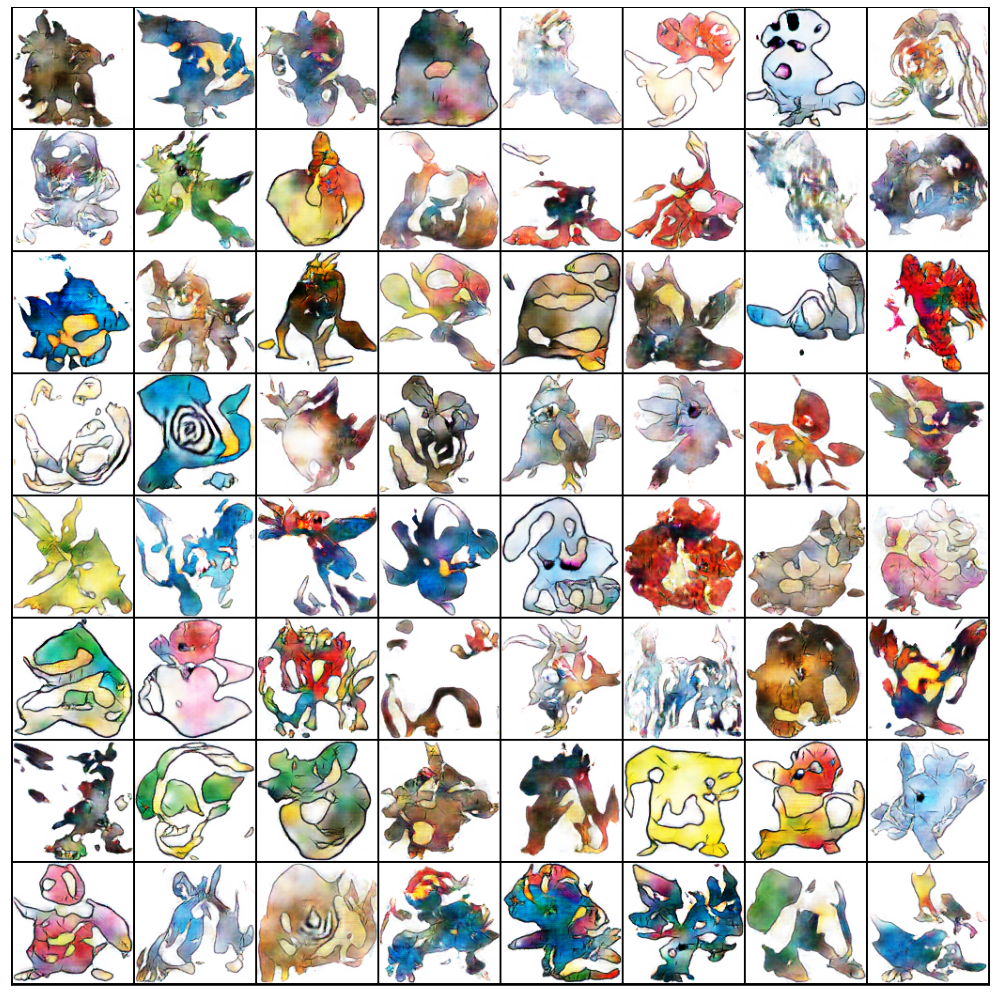

In [42]:
model128_1100 = {
    "discriminator": discriminator_128.to(device),
    "generator": generator_128.to(device)
}
model128_1100['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc_128_1100_epochs.pth"))
model128_1100['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen_128_1100_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model128_1100["generator"](fixed_latent)

show_images(fake_images)

### 1200 epochs

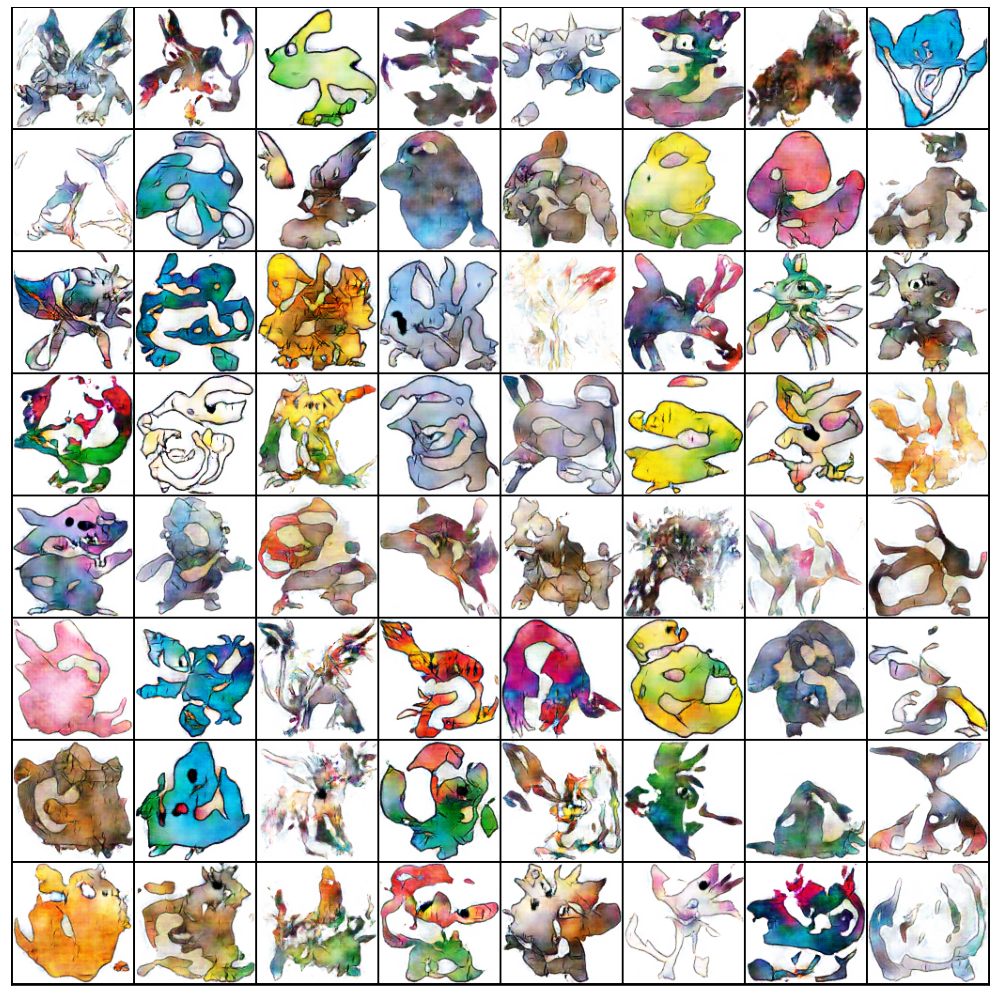

In [43]:
model128_1200 = {
    "discriminator": discriminator_128.to(device),
    "generator": generator_128.to(device)
}
model128_1200['discriminator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/disc_128_1200_epochs.pth"))
model128_1200['generator'].load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/ML/VK_lab/saves/gen_128_1200_epochs.pth"))

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model128_1200["generator"](fixed_latent)

show_images(fake_images)

# Количественная оценка генерируемых изображений

<font size = 4>Получим количественную оценку генерируемых изображений. Для этого</font>
1.  **Сгенерируем столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1**
3. **Пропустим картинки через несколько слоёв классификатора**
2.  **Построим leave-one-out оценку: обучим 1NN Classifier  предсказывать класс на всех объектах, кроме одного, проверим качество (accuracy) на оставшемся объекте**

In [44]:
eff = models.efficientnet_b1(pretrained=True).features[:5].to(device)
summary(eff, input_size=(batch_size, 3, 64, 64))

Downloading: "https://download.pytorch.org/models/efficientnet_b1_rwightman-533bc792.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1_rwightman-533bc792.pth


  0%|          | 0.00/30.1M [00:00<?, ?B/s]

Layer (type:depth-idx)                             Output Shape              Param #
Sequential                                         [128, 80, 4, 4]           --
├─ConvNormActivation: 1-1                          [128, 32, 32, 32]         --
│    └─Conv2d: 2-1                                 [128, 32, 32, 32]         864
│    └─BatchNorm2d: 2-2                            [128, 32, 32, 32]         64
│    └─SiLU: 2-3                                   [128, 32, 32, 32]         --
├─Sequential: 1-2                                  [128, 16, 32, 32]         --
│    └─MBConv: 2-4                                 [128, 16, 32, 32]         --
│    │    └─Sequential: 3-1                        [128, 16, 32, 32]         1,448
│    └─MBConv: 2-5                                 [128, 16, 32, 32]         --
│    │    └─Sequential: 3-2                        [128, 16, 32, 32]         612
│    │    └─StochasticDepth: 3-3                   [128, 16, 32, 32]         --
├─Sequential: 1-3             

In [50]:
def LOO(model, n_batches, image_size):
    size = int(image_size / 16)
    features_real = np.zeros((n_batches * batch_size, 80 * size * size))
    features_fake = np.zeros((n_batches * batch_size, 80 * size * size))

    for ind, real_images in enumerate(train_dl):
        real_images = real_images[0].to(device)
        features_real[ind * batch_size : (ind + 1) * batch_size] = eff(real_images).flatten(start_dim = 1).detach().cpu().numpy()

        fixed_latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = model["generator"](fixed_latent)
        features_fake[ind * batch_size : (ind + 1) * batch_size] = eff(fake_images).flatten(start_dim = 1).detach().cpu().numpy()
        
        if ind + 1 == n_batches:
            break
    
    loo = LeaveOneOut()
    KNN = KNeighborsClassifier(n_neighbors=1)

    total_score = 0
    
    # -1 for LeaveOneOut
    fake_labels = torch.zeros(n_batches * batch_size - 1)
    real_labels = torch.ones(n_batches * batch_size)
    y = np.concatenate((real_labels, fake_labels), axis=0)

    for train_index, test_index in tqdm(loo.split(features_fake)):
        X = np.concatenate((features_real, features_fake[train_index]), axis=0)
        KNN.fit(X, y)
        preds =  KNN.predict_proba(features_fake[test_index])
        total_score += preds[0][0]

    return total_score / features_fake.shape[0]

## image size = 64

In [54]:
image_size = 64
train_dl = get_dataloader(image_size, batch_size, DATA_DIR)

In [55]:
print('900 epochs, LOO = ', LOO(model64_900, n_batches=5, image_size=64))
print('1000 epochs, LOO = ', LOO(model64_1000, n_batches=5, image_size=64))
print('1100 epochs, LOO = ', LOO(model64_1100, n_batches=5, image_size=64))
print('1200 epochs, LOO = ', LOO(model64_1200, n_batches=5, image_size=64))

0it [00:00, ?it/s]

900 epochs, LOO =  0.790625


0it [00:00, ?it/s]

1000 epochs, LOO =  0.7546875


0it [00:00, ?it/s]

1100 epochs, LOO =  0.8140625


0it [00:00, ?it/s]

1200 epochs, LOO =  0.7734375


## image size = 128

In [56]:
image_size = 128
train_dl = get_dataloader(image_size, batch_size, DATA_DIR)

In [57]:
print('900 epochs, LOO = ', LOO(model128_900, n_batches=5, image_size=128))
print('1000 epochs, LOO = ', LOO(model128_1000, n_batches=5, image_size=128))
print('1100 epochs, LOO = ', LOO(model128_1100, n_batches=5, image_size=128))
print('1200 epochs, LOO = ', LOO(model128_1200, n_batches=5, image_size=128))

0it [00:00, ?it/s]

900 epochs, LOO =  0.8609375


0it [00:00, ?it/s]

1000 epochs, LOO =  0.825


0it [00:00, ?it/s]

1100 epochs, LOO =  0.846875


0it [00:00, ?it/s]

1200 epochs, LOO =  0.8328125


<font size = 4> В идеале хотим, чтобы наше accuracy стремилось к 0,5, что означало бы, что распределения эмбэдингов перемешаны настолько хорошо, что произвольная точка взятая из облака являлась бы с равной вероятностью либо реальной, либо фейковой</font>

# Визуализация распределений

<font size = 4>Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность</font>

In [58]:
def calculate_distribution(model):
    batch = next(iter(train_dl))[0]
    embedded_space_real = TSNE(n_components=2).fit_transform(batch.flatten(start_dim=1).numpy())

    fixed_latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = model["generator"](fixed_latent)
    embedded_space_fake = TSNE(n_components=2).fit_transform(fake_images.flatten(start_dim=1).detach().cpu().numpy())

    print(embedded_space_real.shape, embedded_space_fake.shape)
    
    return embedded_space_real, embedded_space_fake

In [59]:
def show_distribution(embedded_space_real, embedded_space_fake):

    plt.figure(figsize=(9, 9))

    plt.scatter(x=embedded_space_real[:, 0], y=embedded_space_real[:, 1], label='Real')
    plt.scatter(x=embedded_space_fake[:, 0], y=embedded_space_fake[:, 1], label='Fake')

    plt.title('Embedded space of images')
    plt.legend()
    plt.show()

## image size = 64

In [60]:
image_size = 64
train_dl = get_dataloader(image_size, batch_size, DATA_DIR)

### 900 epochs

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(128, 2) (128, 2)


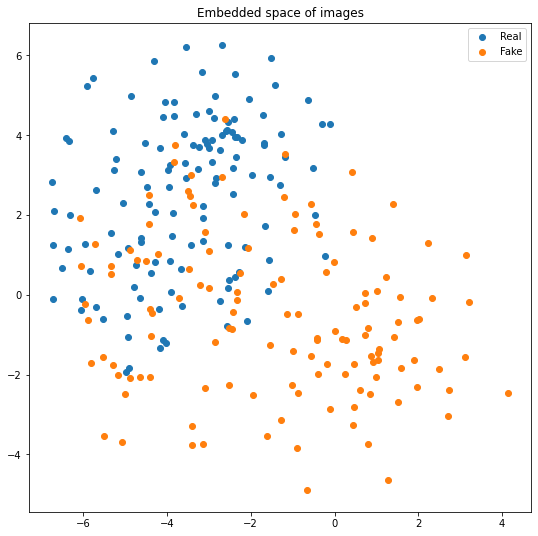

In [61]:
show_distribution(*calculate_distribution(model64_900))

### 1200 epochs

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(128, 2) (128, 2)


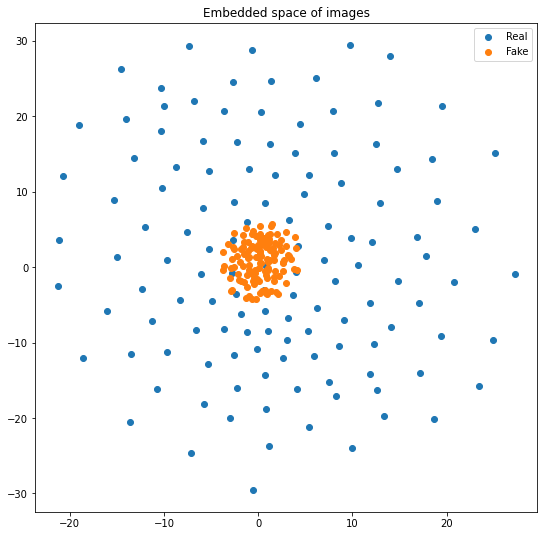

In [62]:
show_distribution(*calculate_distribution(model64_1200))

<font size = 4>Как видим, после 1200 эпох распределение сгенерированных картинок даёт схожий формы облако точек, как и оригинальное. Однако, мы не захватываеем большую область других возможных признаков, так что есть куда расти</font>

## image_size = 128

In [63]:
image_size = 128
train_dl = get_dataloader(image_size, batch_size, DATA_DIR)

### 1100 epochs

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(128, 2) (128, 2)


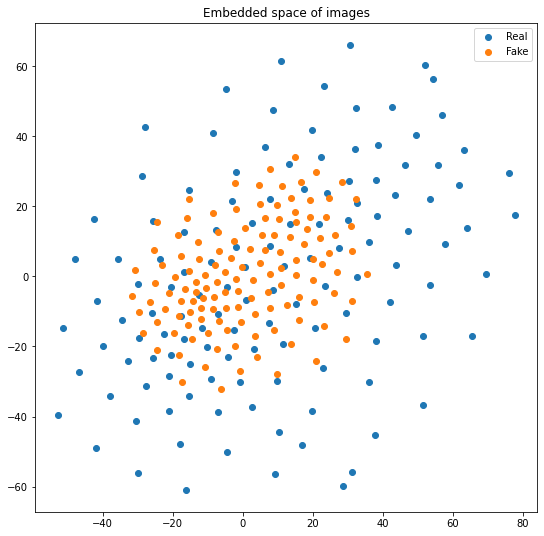

In [65]:
show_distribution(*calculate_distribution(model128_1100))

### 1200 epochs

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(128, 2) (128, 2)


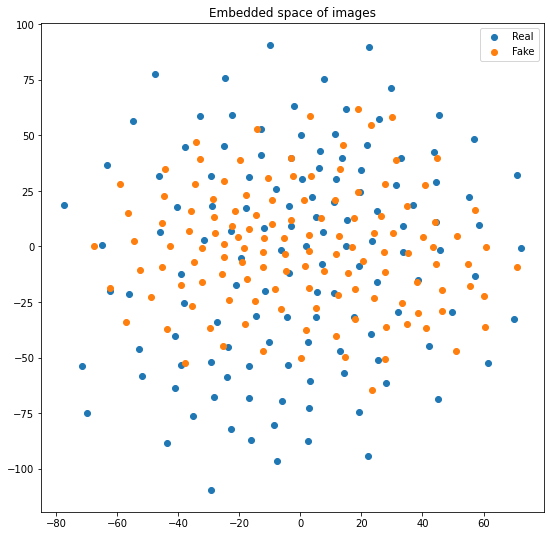

In [66]:
show_distribution(*calculate_distribution(model128_1200))